In [1]:
import requests
from typing import List
from pathlib import Path, PosixPath

from PIL import Image
from IPython.display import display

from transformers import CLIPProcessor, CLIPModel

/mnt/d/coding/git/TomaszKaleczyc/huggingface_tryout/environment/___venv/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Model setup

In [2]:
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

#### Tools

In [3]:
def run_experiments_with_classes(model: CLIPModel, processor: CLIPProcessor, classes: List[str], image_dir: PosixPath) -> None:
    for image_path in image_dir.iterdir():
        print("="*60)
        print(image_path.name)
        image = Image.open(image_path)
        display(image)
        assign_probabilities(model, processor, classes, image)
        print()


def assign_probabilities(model: CLIPModel, processor: CLIPProcessor, classes: List[str], image: Image) -> None:
    inputs = processor(text=classes, images=image, return_tensors="pt", padding=True)
    outputs = model(**inputs)
    logits_per_image = outputs.logits_per_image
    probs = logits_per_image.softmax(dim=1)
    print("Class probabilities:")
    for defined_class, probability in zip(classes, probs[0]):
        print(f'\t* {defined_class}: {probability:.1%}')


### Experiments

In [4]:
image_dir = Path("../test_data/test_images")

poles.jpg


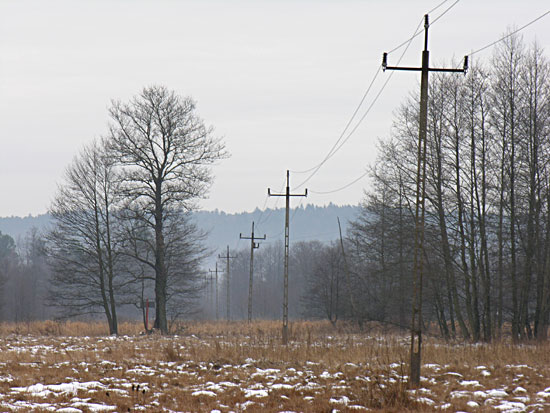

Class probabilities:
	* winter landscape: 99.4%
	* summer landscape: 0.6%

poles2.jpg


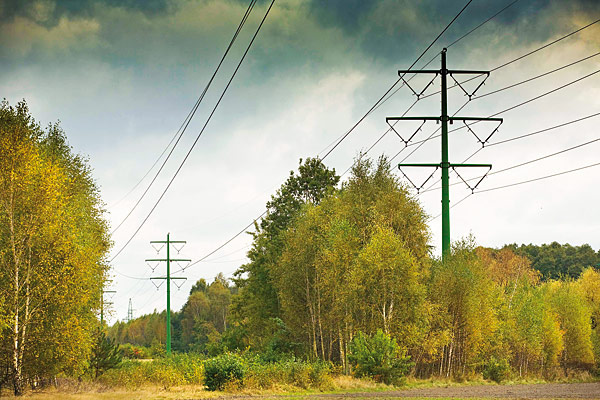

Class probabilities:
	* winter landscape: 6.6%
	* summer landscape: 93.4%

poles3.jpg


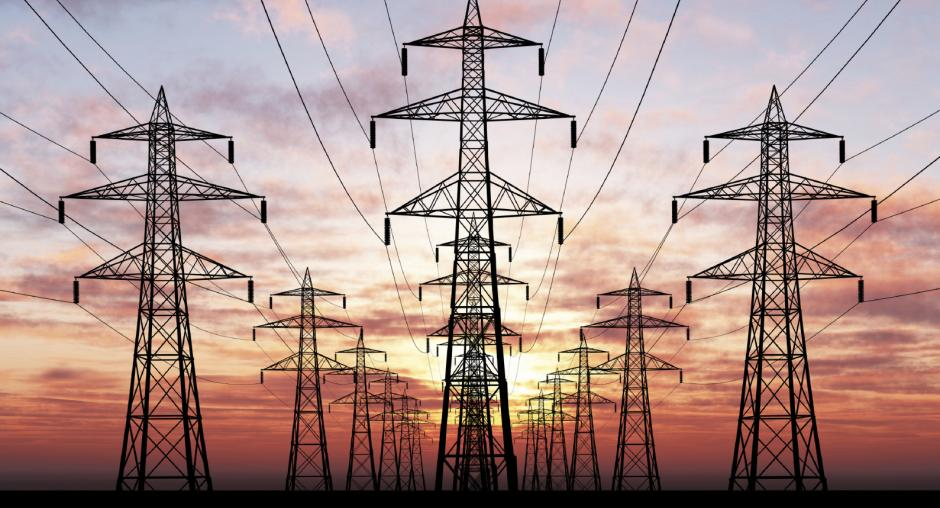

Class probabilities:
	* winter landscape: 21.5%
	* summer landscape: 78.5%

poles4.jpg


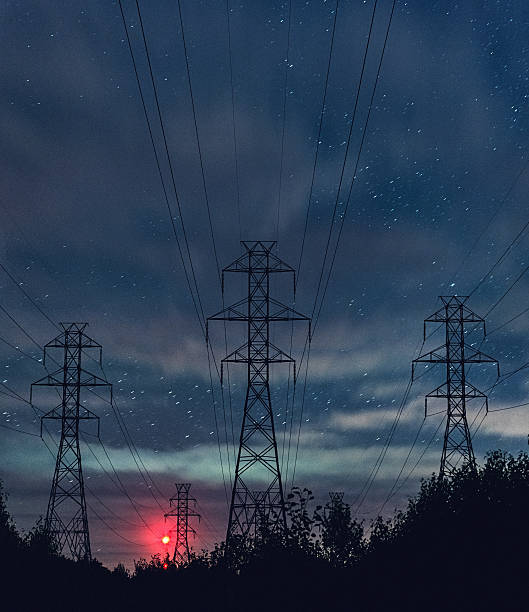

Class probabilities:
	* winter landscape: 28.9%
	* summer landscape: 71.1%



In [5]:
classes = ['winter landscape', 'summer landscape']
run_experiments_with_classes(model, processor, classes, image_dir)

poles.jpg


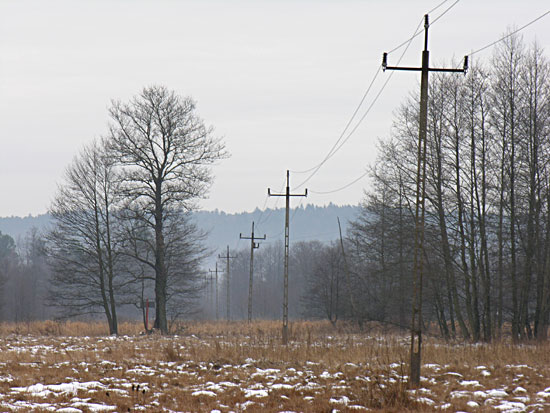

Class probabilities:
	* trees visible: 79.2%
	* no trees visible: 20.8%

poles2.jpg


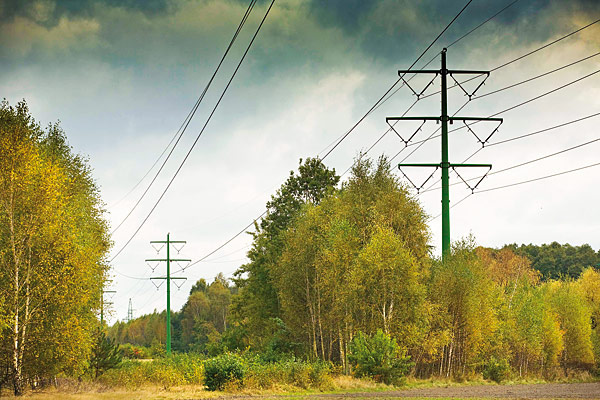

Class probabilities:
	* trees visible: 76.3%
	* no trees visible: 23.7%

poles3.jpg


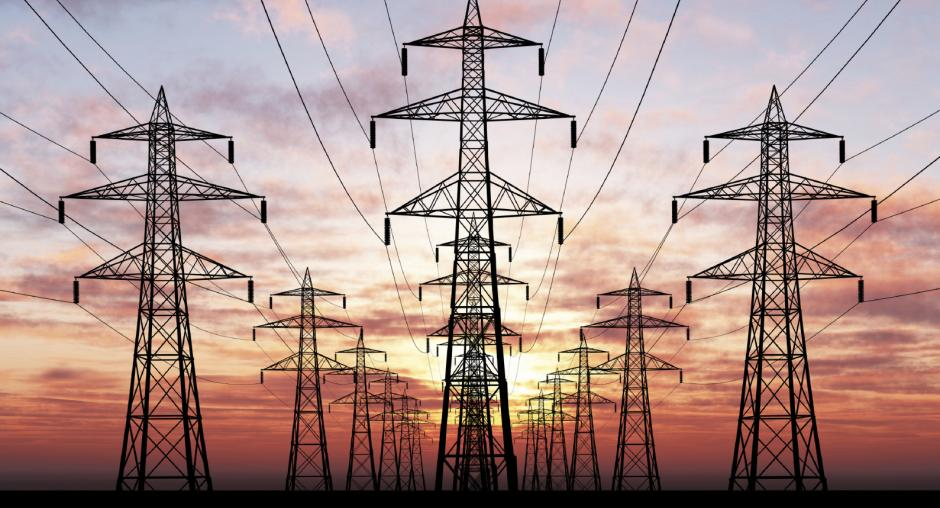

Class probabilities:
	* trees visible: 33.8%
	* no trees visible: 66.2%

poles4.jpg


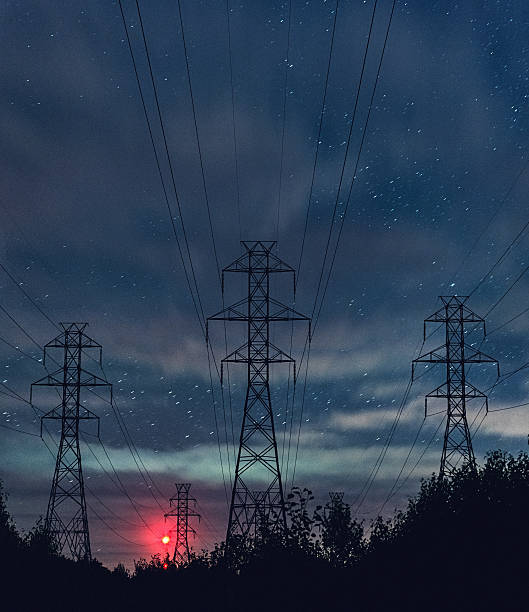

Class probabilities:
	* trees visible: 36.4%
	* no trees visible: 63.6%



In [6]:
classes = ['trees visible', 'no trees visible']
run_experiments_with_classes(model, processor, classes, image_dir)

poles.jpg


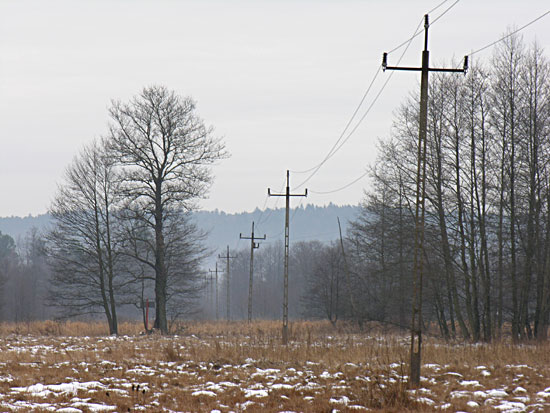

Class probabilities:
	* midday: 93.7%
	* evening: 5.5%
	* night: 0.8%

poles2.jpg


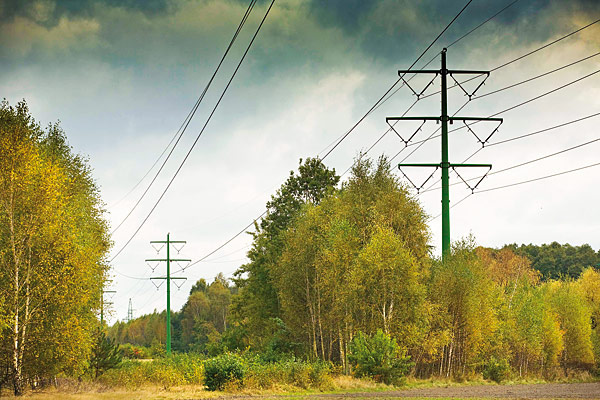

Class probabilities:
	* midday: 70.8%
	* evening: 26.2%
	* night: 3.0%

poles3.jpg


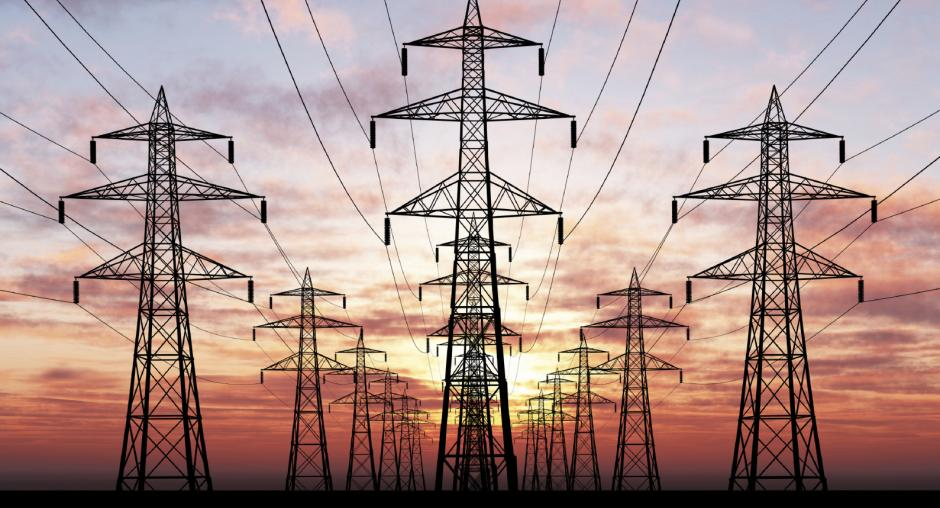

Class probabilities:
	* midday: 12.9%
	* evening: 69.5%
	* night: 17.6%

poles4.jpg


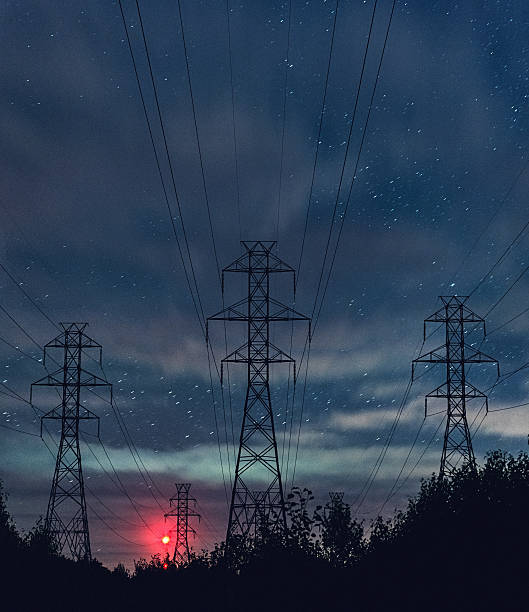

Class probabilities:
	* midday: 4.5%
	* evening: 67.9%
	* night: 27.6%



In [7]:
classes = ['midday', 'evening', 'night']
run_experiments_with_classes(model, processor, classes, image_dir)

poles.jpg


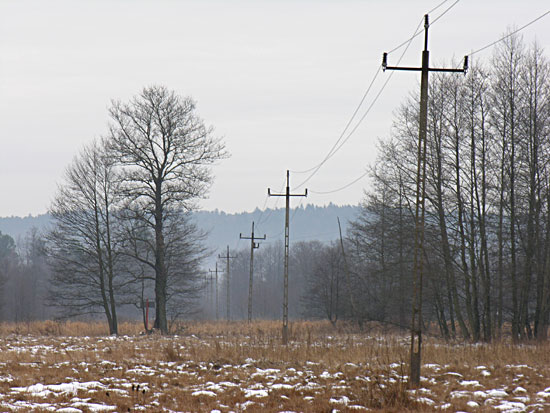

Class probabilities:
	* powerlines visible: 89.8%
	* no powerlines visible: 10.2%

poles2.jpg


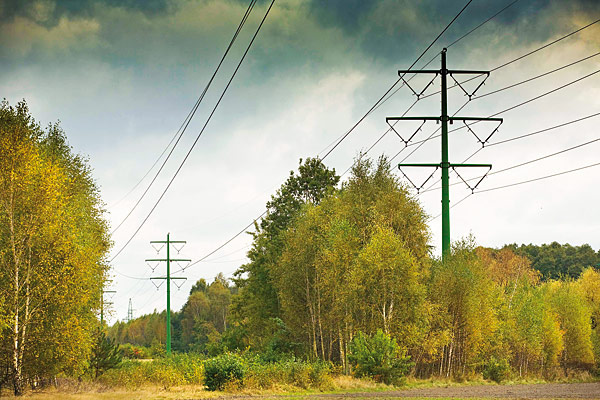

Class probabilities:
	* powerlines visible: 92.4%
	* no powerlines visible: 7.6%

poles3.jpg


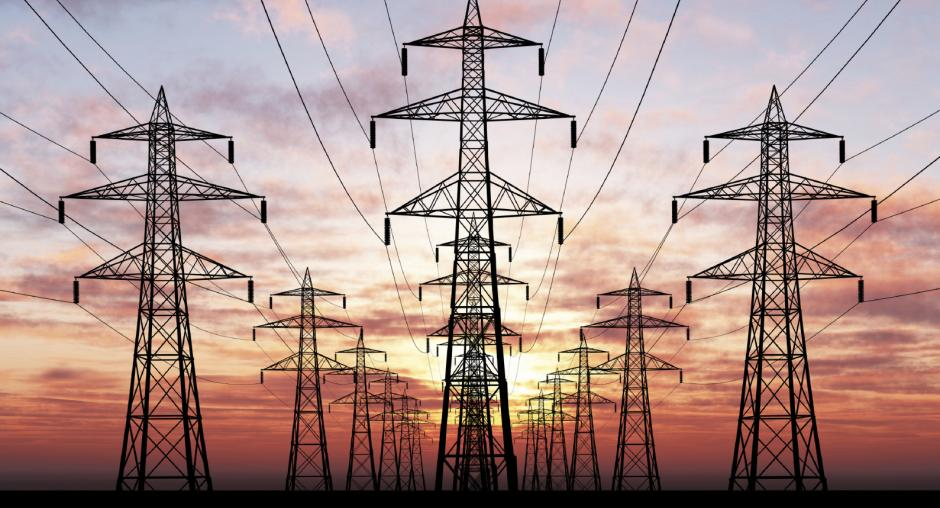

Class probabilities:
	* powerlines visible: 78.7%
	* no powerlines visible: 21.3%

poles4.jpg


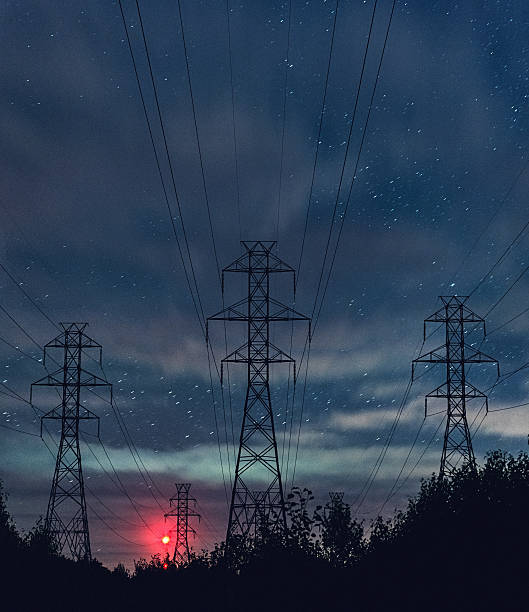

Class probabilities:
	* powerlines visible: 82.0%
	* no powerlines visible: 18.0%



In [8]:
classes = ['powerlines visible', 'no powerlines visible']
run_experiments_with_classes(model, processor, classes, image_dir)